In [91]:
%matplotlib inline
import os
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np

In [53]:
data_dir = '/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI'
os.listdir(data_dir)

['0415',
 '0314',
 '2053',
 '2036',
 '0026',
 '2052',
 '2040',
 '0096',
 '0015',
 '0006',
 '0401',
 '0175',
 '0123',
 '2013',
 '0199',
 '0450',
 '0332',
 '0435',
 '0378',
 '0029',
 '001',
 '0384',
 '0041',
 '2050',
 'CASE 2^2',
 '2012',
 '2029',
 '0024',
 '0291',
 '1753',
 '2032',
 '0014',
 '0424',
 '2060',
 '0021',
 '0344',
 '0094',
 '0043',
 '2015',
 '0047',
 '2033',
 '0020',
 '0135',
 '0395',
 '0084',
 '0213',
 'CASE 1^1',
 '0079',
 '0126',
 '0155',
 '0172',
 '0164',
 '2007',
 '0167',
 '0189',
 '0173',
 '0362']

In [58]:
subject_id = '0006'
os.listdir(f'{data_dir}/{subject_id}')

['t1_pos_0_water.nii',
 'mre_mask.nii',
 'wave.nii',
 'mre.nii',
 't1_pos_160_out.nii',
 't1_pre_out.nii',
 'mre_phase.nii',
 't1_pos_0_in.nii',
 'mre.pkl',
 't1_pos_300_fat.nii',
 't1_pos_0_out.nii',
 'MRE_DICOM_7-31-19_DICOMD_PA0',
 'mre_raw.nii',
 't1_pos_70_out.nii',
 't1_pos_0_fat.nii',
 't2.nii',
 't1_pre_fat.nii',
 't1_pos_70_in.nii',
 't1_pos_300_water.nii',
 't1_pos_70_fat.nii',
 'mre_wave.nii',
 't1_pos_160_water.nii',
 't1_pos_160_in.nii',
 't1_pos_160_fat.nii',
 't1_pre_water.nii',
 't1_pre_in.nii',
 't1_pos_70_water.nii',
 'dwi.nii']

(4, 512, 512, 3) uint8
(1.0, 1.0, 1.0)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


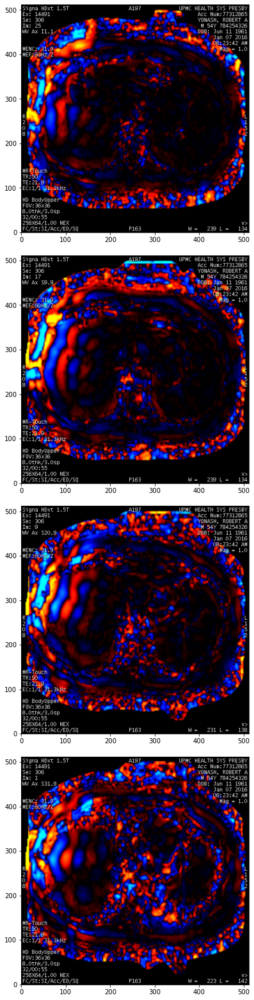

In [100]:
def myshow(img, dpi=40, margin=0.1):
    
    # convert SITK image to numpy array
    arr = sitk.GetArrayViewFromImage(img)
    print(arr.shape, arr.dtype)

    # get spacing of image pixels
    spacing = img.GetSpacing()[::-1]
    print(spacing)
    
    direction = img.GetDirection()
    print(np.reshape(direction, (3,3)))
    
    # must be 2D or 3D; grayscale, RGB, or RGBA
    assert arr.ndim in {2,3,4}, arr.ndim
    
    # last dimension determines if RGB/RGBA
    rgb = arr.shape[-1] in {3, 4} # RGB or RGBA
    
    # promote to 3D for plotting purposes
    if arr.shape == 2 or (arr.shape == 3 and rgb):
        arr = arr[np.newaxis,...]
        spacing = arr[np.newaxis,...]
    
    # set spatial extent of image
    z_shape, y_shape, x_shape = arr.shape[:3]
    z_space, y_space, x_space = spacing
    extent = [0, x_shape*x_space, 0, y_shape*y_space]
    
    # plot z slices as subplots
    n_rows, n_cols = arr.shape[0], 1
    ax_h = (1 + margin) * y_shape / dpi
    ax_w = (1 + margin) * x_shape / dpi
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(ax_w*n_cols, ax_h*n_rows))
    plt.subplots_adjust(hspace=margin, wspace=margin)
    
    for i, a in enumerate(arr):
        axes[i].imshow(a, extent=extent, cmap=None if rgb else plt.cm.Greys_r)
        #axes[i].axis('off')

img_name = 'wave'
img = sitk.ReadImage(f'{data_dir}/{subject_id}/{img_name}.nii')
myshow(img, dpi=80)

In [95]:
import mre_ai.registration

pat = mre_ai.registration.RegPatient(subject_id, data_dir)
pat

/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006
loading niftis
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/t1_pos_0_water.nii
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/mre_mask.nii
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/wave.nii
correcting wave image
(512, 512, 4)
(0.0, 0.0, 0.0)
(1.0, 1.0, 1.0)
(1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0)
3
vector of 8-bit unsigned integer
(4, 512, 512, 3)
(4, 512, 512, 3)
(512, 512, 4)
(0.0, 0.0, 0.0)
(1.0, 1.0, 1.0)
(1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0)
1
16-bit signed integer
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/mre.nii
mre 16-bit signed integer
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/t1_pos_160_out.nii
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/t1_pre_out.nii
/ocean/projects/asc170022p/shared/Data/MRE/MRE_DICOM_7-31-19/NIFTI/0006/m

In [97]:
pat.images.keys()

dict_keys(['t1_pos_0_water', 'mre_mask', 'wave', 'mre', 't1_pos_160_out', 't1_pre_out', 'mre_phase', 't1_pos_0_in', 't1_pos_300_fat', 't1_pos_0_out', 'mre_raw', 't1_pos_70_out', 't1_pos_0_fat', 't2', 't1_pre_fat', 't1_pos_70_in', 't1_pos_300_water', 't1_pos_70_fat', 'mre_wave', 't1_pos_160_water', 't1_pos_160_in', 't1_pos_160_fat', 't1_pre_water', 't1_pre_in', 't1_pos_70_water', 'dwi'])

(4, 512, 512) int16
(1.0, 1.0, 1.0)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


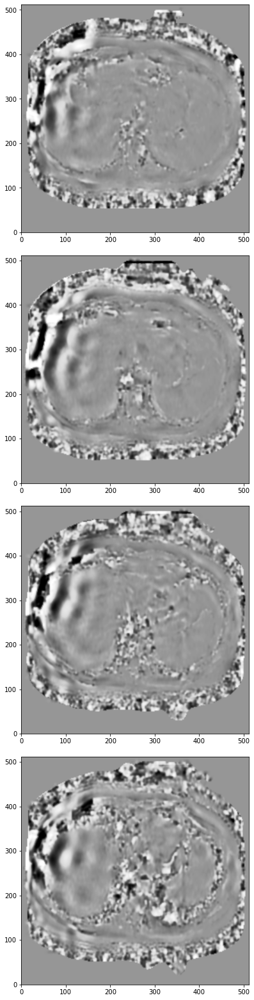

In [101]:
myshow(pat.images['wave'], dpi=80)

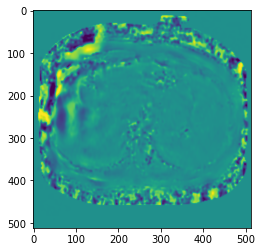

In [127]:
# these are the operations performed in RegPatient.correct_wave_image
#   how was this method created and validated?

from skimage.morphology import binary_dilation
from skimage.restoration import inpaint

img = sitk.ReadImage(f'{data_dir}/{subject_id}/{img_name}.nii')
img_array = sitk.GetArrayViewFromImage(img)

# RGB image components
img_r = np.squeeze(img_array[:, :, :, 0]).astype(float)
img_g = np.squeeze(img_array[:, :, :, 1]).astype(float)
img_b = np.squeeze(img_array[:, :, :, 2]).astype(float)

img_gr = np.where(img_r == 0, 0, img_g) # green where red is not zero
img_gb = np.where(img_b == 0, 0, img_g) # green where blue is not zero

# the text is white
img_gg = np.where((img_b == 255) & (img_r == 255) & (img_g == 255), 1, 0)

# isolate text from original image, but it contains the wave too?
img_array = 0.001*(img_r+img_gr)  - 0.001*(img_b+img_gb) + img_gg

# create an array with a text mask, expand the mask, and do inpainting
array = np.ma.masked_where(img_array == 1, img_array)
for i in range(img_array.shape[0]):
    array[i].mask = binary_dilation(array[i].mask)
    array[i].mask = binary_dilation(array[i].mask)
    img_array[i] = inpaint.inpaint_biharmonic(img_array[i], array[i].mask)

plt.imshow(img_array[0])

In [129]:
moving = pat.images['t2']
fixed = pat.images['t1_pre_water']

# Config setting for mri sequences.  Check the source code to see all the potential parameters.
# Check https://simpleelastix.readthedocs.io/ for more info on parameters
# The registration is verbose, but does not print to the Notebook.  
reg1 = mre_ai.registration.Register(fixed, moving, dry_run=False, config='mri_seq')

(88, 512, 512) int16
(2.3000030517578125, 0.7031000256538391, 0.7031000256538391)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


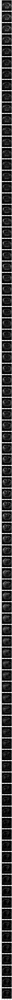

In [134]:
myshow(reg1.fixed_img, dpi=160)

(23, 256, 256) int16
(10.0, 1.4062999486923218, 1.4062999486923218)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


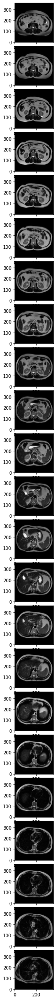

In [135]:
myshow(reg1.moving_img, dpi=160)

(88, 512, 512) int16
(2.3000030517578125, 0.7031000256538391, 0.7031000256538391)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


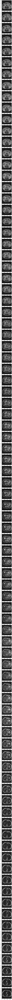

In [136]:
myshow(reg1.moving_img_result, dpi=160)

/jet/home/mtragoza/.conda/envs/mre_ai/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.4.0, the latest is 0.5.0.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
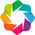

:Dataset   [z1,y,x]   (moving_init)


Column
    [0] FloatSlider(name='moving_final', value=0.5)
    [1] Row
        [0] HoloViews(Layout)
        [1] Column
            [0] WidgetBox
                [0] DiscreteSlider(margin=(20, 20, 5, 20), name='z', options=OrderedDict([('-142.01', ...]), value=-142.01300048828125, width=250)
                [1] DiscreteSlider(margin=(5, 20, 20, 20), name='z1', options=OrderedDict([('-154.52', ...]), value=-154.51600646972656, width=250)
            [1] VSpacer()

In [137]:
import mre_ai.plotting
mre_ai.plotting.patient_reg_comparison(reg1.fixed_img, reg1.moving_img, reg1.moving_img_result)